In [2]:
import pandas as pd
import geopandas as geopd
import numpy as np
import csv

import os
# custom utils
from timeseries_utils import read_daily_timeseries_csv

from matplotlib.ticker import FuncFormatter
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt

plt.rcParams["figure.dpi"]  = 300
plt.rcParams.update({'font.size': 12})
plt.rcParams['font.family'] = 'sans-serif'
#plt.style.use('dark_background')

# This script visualizes time series data for various climate and hydrological variables.
# It reads time series data from CSV files, preprocesses the data, and generates various plots to visualize the results.

In [3]:
@FuncFormatter
def date_formatter(x, pos):
    time = pd.to_datetime(data_range[0]) + pd.Timedelta(days=x*resampling_freq)
    label = f"{time.year}"
    return label

def preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, src_path, data_range ):
    catchments = geopd.read_file(catchments_path, layer='attributes_v1')
    gauges = list(catchments['Paikka_Id'])

    natural_catchments = geopd.read_file(natural_gauges_path, layer='suitable_from_1995')
    natural_gauges = list(natural_catchments['Paikka_Id'])
    
    year_count = int(data_range[1])-int(data_range[0])

    mean_tmp = read_daily_timeseries_csv(mean_tmp_path)
    mean_tmp = mean_tmp.loc[data_range[0]:data_range[1], gauges]
    
    data = read_daily_timeseries_csv(src_path) 
    data = data.loc[data_range[0]:data_range[1], gauges]

    sort_index = mean_tmp.mean().sort_values().index
    data = data[sort_index]

    region_codes = list(catchments.water_region_code.unique())
    region_codes.sort(reverse=True)
    final_sort = []
    for region_code in region_codes:
        region_catchments = catchments.loc[catchments.water_region_code == region_code]
        region_gauges = list(region_catchments.Paikka_Id)
        region_sort = [gauge for gauge in sort_index if gauge in region_gauges]
        final_sort.extend(region_sort)

    data=data[final_sort]
    dropped_data = data.dropna(axis=1, thresh=year_count*340)
    resampled_data = dropped_data.resample(str(resampling_freq) +'D').mean()
    resampled_data = resampled_data.transpose()
    
    natural_data = resampled_data.loc[resampled_data.index.isin(natural_gauges)]
    unnatural_data = resampled_data.loc[~resampled_data.index.isin(natural_gauges)]

    return resampled_data, natural_data, unnatural_data

In [5]:
# Paths to the catchment and natural gauges data
catchments_path = "/media/iielse/T9/CAMELS-FI/data/CAMELS_FI_catchment_boundaries.gpkg"
natural_gauges_path = "/path/to/measurement_locations.gpkg"

mean_tmp_path = '/media/iielse/T9/CAMELS-FI/data/timeseries-by-attribute/temperature_mean.csv'

src_root = '/media/iielse/T9/CAMELS-FI/data/timeseries-by-attribute/'

data_range = ("1990", "2020")
year_count = int(data_range[1])-int(data_range[0])

resampling_freq = 4

tick_freq = 5 # years
year_ticks = list(range(int(data_range[0]), int(data_range[1]) + 1, tick_freq))
year_ticks = list(map(str, year_ticks))
year_ticks = list(map(pd.to_datetime, year_ticks))

ticks = []
for tick in year_ticks:
    day_delta = pd.Timedelta(tick - year_ticks[0], unit='D').days
    sample_delta = np.ceil(day_delta / resampling_freq)
    ticks.append(sample_delta)

labels = list(map(date_formatter, ticks))

# Figure size in centimeters
cm_conversion = 1/2.54  # centimeters in inches, for plt
width = 54 * cm_conversion
height = 6.5*cm_conversion

In [6]:
# Preprocess and plot precipitation data
vmax=15
vmin=0
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'precipitation.csv'), data_range)
plt_data = resampled_data

plt_data = plt_data.where(cond=plt_data> 0.05, other=np.nan)
cmap= LinearSegmentedColormap.from_list('DIWA', ['#11548a', '#4ca9ff', '#83e7fc', '#ffffff'])

fig, ax = plt.subplots(figsize=(width, height))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmin=vmin, vmax=vmax, aspect='auto', interpolation='none')

result_ticks = ax.set_xticks(ticks, labels)
plt.title('Precipitation', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('mm', rotation=90)
cbar.set_ticklabels([f'{vmin}', str(round((vmax-vmin)/2, 1)), f'>{vmax}'])
dst_path = 'weather/precipitation_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

DataSourceError: /path/to/CAMELS-FI_catchments.gpkg: No such file or directory

In [ ]:
# Preprocess and plot mean temperature data
vmax=25
vmin=-25
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'temperature_mean.csv'), data_range)
plt_data = resampled_data

cmap='RdBu_r'
fig, ax = plt.subplots(figsize=(width, height))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmin=vmin, vmax=vmax, aspect='auto', interpolation='none')

result_ticks = ax.set_xticks(ticks, labels)
plt.title('Mean temperature', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[vmin+0.05, 0, vmax])
cbar.ax.set_ylabel('°C', rotation=0)
cbar.set_ticklabels([f'<{vmin}', '0', f'{vmax}'])
dst_path = 'weather/mean_temperature_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

In [22]:

"""
with open('colorbars/order.csv', 'w') as dst:
    csv_writer = csv.writer(dst)
    csv_writer.writerow(resampled_data.index)
    """"

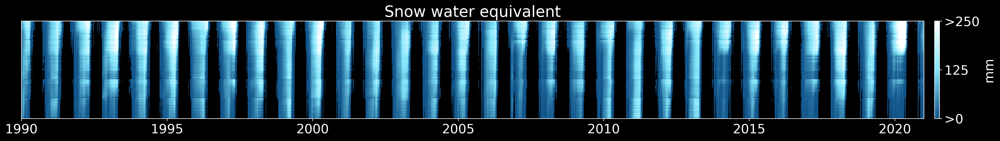

In [23]:
# Preprocess and plot snow water equivalent data
vmax=250
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'swe.csv'), data_range)
plt_data = resampled_data

plt_data = plt_data.replace(0, np.nan)
cmap= LinearSegmentedColormap.from_list('DIWA', ['#11548a', '#83e7fc', '#ffffff'])

fig, ax = plt.subplots(figsize=(width, height))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmax=vmax, aspect='auto', interpolation='none')

result_ticks = ax.set_xticks(ticks, labels)
plt.title('Snow water equivalent', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('mm', rotation=90)
cbar.set_ticklabels(['>0', str(int(round(vmax/2, 0))), f'>{vmax}'])
dst_path = 'weather/swe_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

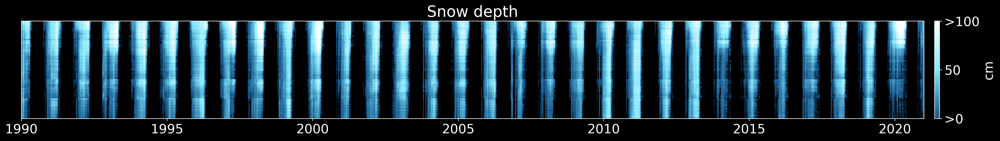

In [24]:
# Preprocess and plot snow depth data
vmax=100
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'snow_depth.csv'), data_range)
plt_data = resampled_data

plt_data = plt_data.replace(0, np.nan)
cmap= LinearSegmentedColormap.from_list('DIWA', ['#11548a', '#83e7fc', '#ffffff'])

fig, ax = plt.subplots(figsize=(width, height))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmax=vmax, aspect='auto', interpolation='none')

result_ticks = ax.set_xticks(ticks, labels)
plt.title('Snow depth', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('cm', rotation=90)
cbar.set_ticklabels(['>0', str(int(round(vmax/2, 0))), f'>{vmax}'])
dst_path = 'weather/snow_depth_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

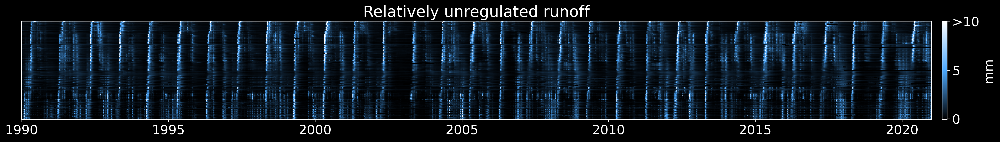

In [25]:
# Preprocess and plot relatively unregulated runoff data
vmax=10
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'discharge_spec.csv'), data_range)
plt_data = natural_data

cmap= LinearSegmentedColormap.from_list('DIWA', ['#000000', '#4CA9FF', '#ffffff'])

fig, ax = plt.subplots(figsize=(width, height))
ax.yaxis.set_visible(False)
imax = ax.imshow(plt_data, cmap=cmap, vmax=vmax, aspect='auto', interpolation='none')
result_ticks = ax.set_xticks(ticks, labels)

plt.title(f'Relatively unregulated runoff', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('mm', rotation=90)
cbar.set_ticklabels(['0', str(int(round(vmax/2, 0))), f'>{vmax}'])
dst_path = 'weather/dis_spec_natural_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

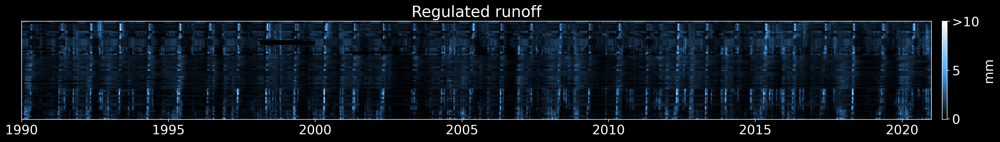

In [26]:
# Preprocess and plot regulated runoff data
vmax=10
resampled_data, natural_data, unnatural_data = preprocess_timeseries(catchments_path, natural_gauges_path, mean_tmp_path, os.path.join(src_root, 'discharge_spec.csv'), data_range)
plt_data = unnatural_data

cmap= LinearSegmentedColormap.from_list('DIWA', ['#000000', '#4CA9FF', '#ffffff'])

fig, ax = plt.subplots(figsize=(width, height))

imax = ax.imshow(plt_data, cmap=cmap, vmax=vmax, aspect='auto', interpolation='none')
ax.yaxis.set_visible(False)
result_ticks = ax.set_xticks(ticks, labels)

plt.title('Regulated runoff', loc='center')
plt.tight_layout(pad=0)

cbar = plt.colorbar(imax, pad=0.01, ticks=[0.05, vmax/2, vmax])
cbar.ax.set_ylabel('mm', rotation=90)
cbar.set_ticklabels(['0', str(int(round(vmax/2, 0))), f'>{vmax}'])
dst_path = 'weather/dis_spec_unnatural_1990_2020.png'
plt.savefig(dst_path, transparent=True, dpi=300)

In [27]:
# Saving the order for regional colorbar
with open('colorbars/natural_order.csv', 'w') as dst:
    csv_writer = csv.writer(dst)
    csv_writer.writerow(list(natural_data.index))

with open('colorbars/unnatural_order.csv', 'w') as dst:
    csv_writer = csv.writer(dst)
    csv_writer.writerow(list(unnatural_data.index))

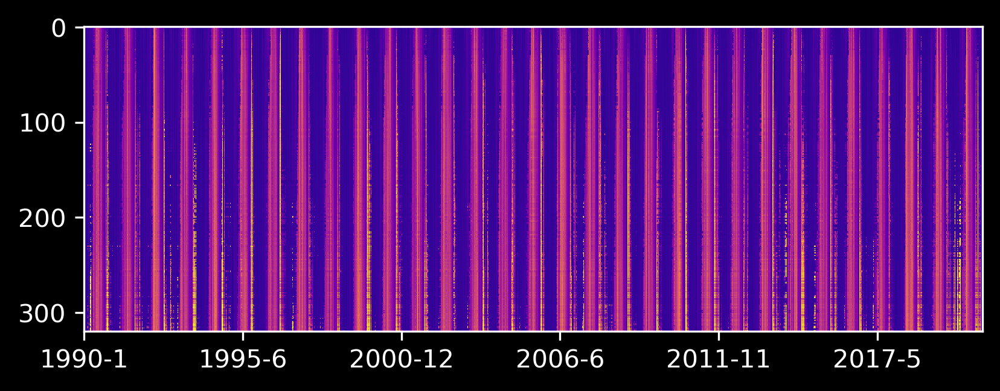

In [38]:
# Plot potential evaporation data
fig, ax = plt.subplots()
imax = ax.imshow(resampled_data, cmap='plasma', vmax=8, aspect=3, interpolation='none')
ticks = ax.get_xticks()
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

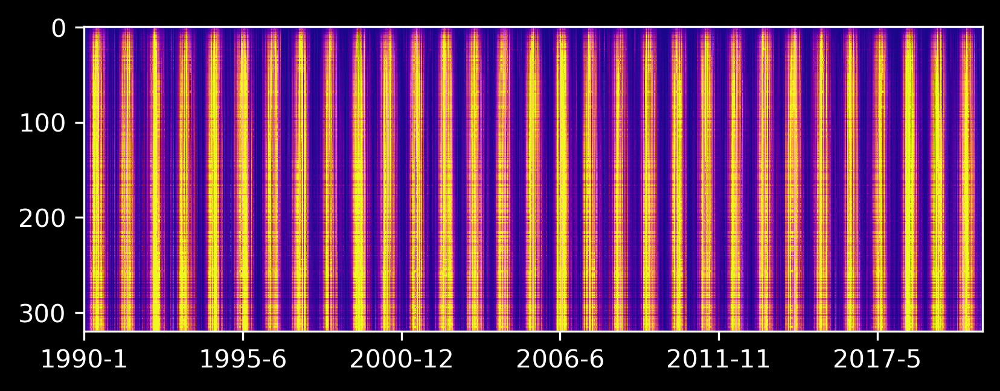

In [42]:
fig, ax = plt.subplots()
imax = ax.imshow(resampled_data, cmap='plasma', vmax=20, aspect=3, interpolation='none')
ticks = ax.get_xticks()
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

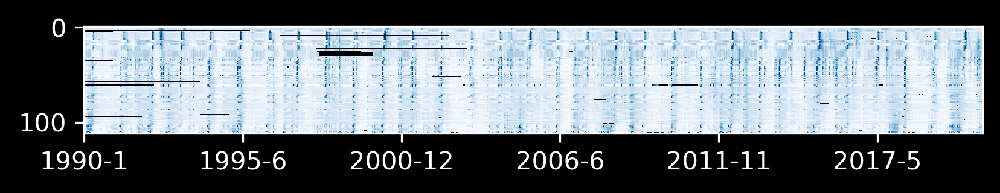

In [28]:
# Plot unnatural discharge data
fig, ax = plt.subplots()
imax = ax.imshow(unnatural_data, cmap='Blues', vmax=5, aspect=3, interpolation='none')

ticks = ax.get_xticks()
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

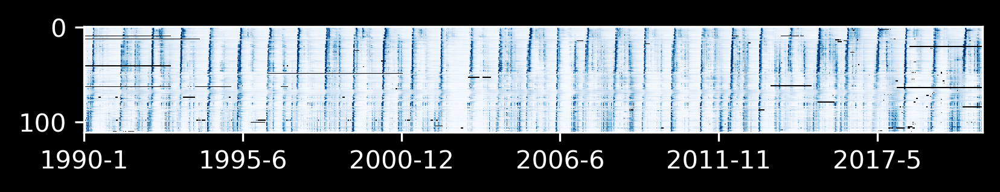

In [29]:
# Plot natural discharge data
fig, ax = plt.subplots()
imax = ax.imshow(natural_data, cmap='Blues', vmax=5, aspect=3, interpolation='none')
ticks = ax.get_xticks()
# For some reason, the first tick  and last tick are beyond range
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

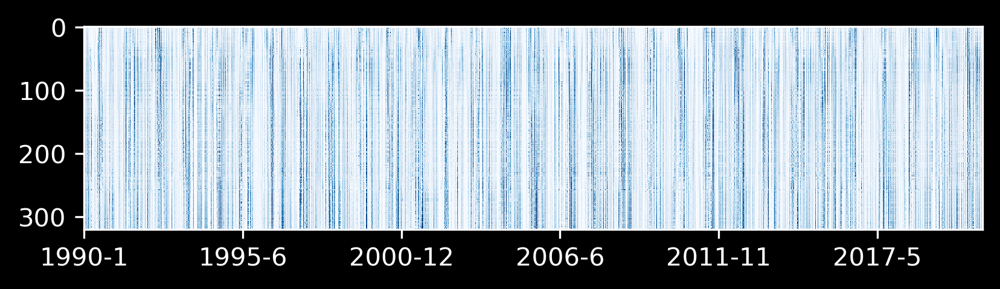

In [8]:
# Plot precipitation data
fig, ax = plt.subplots()
imax = ax.imshow(resampled_data, cmap='Blues',vmax=10, aspect=2, interpolation='none')
ticks = ax.get_xticks()
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

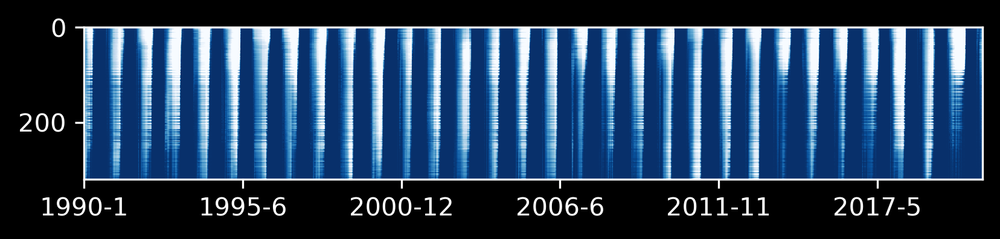

In [20]:
# Plot snow depth data
fig, ax = plt.subplots()
imax = ax.imshow(resampled_data, cmap='Blues_r',vmax=150, aspect=1.5, interpolation='none')
ticks = ax.get_xticks()
# For some reason, the first tick  and last tick are beyond range
ticks = ticks[1:-1]
labels = list(map(date_formatter, ticks))
result_ticks = ax.set_xticks(ticks, labels)

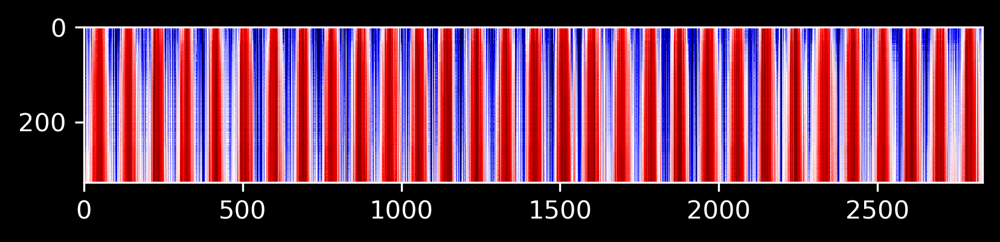

In [71]:
# Plot temperature data
ax = plt.imshow(resampled_data, cmap='seismic', vmin=(-20, 20), aspect=1.5, interpolation='none')

In [26]:
data_series = data.mean() 
data_series.name = 'q_spec_mean'
catchments = catchments.join(data_series, on='Paikka_Id')

In [27]:
catchments.to_file(catchments_path, layer="attributes_v1", driver='GPKG')